# <a id='toc1_'></a>[<span style='color:yellow;'>HW: Parkour Athlete Tracking</span>](#toc0_)

**Table of contents**<a id='toc0_'></a>    
- [<span style='color:yellow;'>HW: Parkour Athlete Tracking</span>](#toc1_)    
  - [Assignment Overview](#toc1_1_)    
  - [Learning Objectives](#toc1_2_)    
  - [Prerequisites](#toc1_3_)    
  - [Required Libraries](#toc1_4_)    
  - [Tasks to Complete](#toc1_5_)    
    - [Environment Setup (10%)](#toc1_5_1_)    
    - [Frame Preprocessing (15%)](#toc1_5_2_)    
    - [Model Configuration (15%)](#toc1_5_3_)    
    - [Video Configuration (10%)](#toc1_5_4_)    
    - [Tracking System Implementation (25%)](#toc1_5_5_)    
    - [Video Processing Pipeline (15%)](#toc1_5_6_)    
    - [Data Logging (5%)](#toc1_5_7_)    
    - [Results Visualization (5%)](#toc1_5_8_)    
  - [Deliverables](#toc1_6_)    
  - [Video Source](#toc1_7_)    
  - [Evaluation Criteria](#toc1_8_)    
  - [Tips for Success](#toc1_9_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

## <a id='toc1_1_'></a>[Assignment Overview](#toc0_)
In this homework, you will build a complete computer vision pipeline to track parkour athletes in a video using object detection and tracking algorithms. You'll work with OpenCV, YOLOv8, and Python to create a system that can identify, track, and analyze the movement of people performing parkour stunts.

## <a id='toc1_2_'></a>[Learning Objectives](#toc0_)
- Apply object detection using state-of-the-art YOLO models
- Implement tracking algorithms to maintain consistent identification of moving objects
- Preprocess video frames to improve detection accuracy
- Analyze and visualize tracking results
- Work with video I/O operations and data logging

## <a id='toc1_3_'></a>[Prerequisites](#toc0_)
- Basic Python programming skills
- Familiarity with NumPy for numerical operations
- Understanding of computer vision concepts (pixels, frames, bounding boxes)
- Prior experience with Jupyter Notebooks (helpful but not required)

## <a id='toc1_4_'></a>[Required Libraries](#toc0_)
You'll need to install these libraries:opencv-python
numpy
matplotlib
ultralytics
tqdm

## <a id='toc1_5_'></a>[Tasks to Complete](#toc0_)

### <a id='toc1_5_1_'></a>[Environment Setup (10%)](#toc0_)
- Import all required libraries
- Verify library installations with a status message

### <a id='toc1_5_2_'></a>[Frame Preprocessing (15%)](#toc0_)
- Create a function to preprocess video frames for better detection
- Implement contrast enhancement using CLAHE (Contrast Limited Adaptive Histogram Equalization)
- Convert between color spaces appropriately

### <a id='toc1_5_3_'></a>[Model Configuration (15%)](#toc0_)
- Load the YOLOv8 Nano model
- Configure detection parameters:
  - Target class (person)
  - Confidence threshold
  - IoU (Intersection over Union) threshold
- Display a model setup summary

### <a id='toc1_5_4_'></a>[Video Configuration (10%)](#toc0_)
- Define input/output file paths
- Create output directories if they don't exist
- Retrieve and display input video properties (resolution, FPS, duration)
- Initialize a video writer with appropriate codec settings

### <a id='toc1_5_5_'></a>[Tracking System Implementation (25%)](#toc0_)
- Design a tracking system that:
  - Assigns unique IDs to detected athletes
  - Maintains tracking across frames
  - Handles temporary disappearances of tracked objects
  - Updates tracking data with each new frame
- Implement centroid distance calculation for matching objects between frames

### <a id='toc1_5_6_'></a>[Video Processing Pipeline (15%)](#toc0_)
- Create a multi-stage processing pipeline:
  - Read and preprocess frames
  - Run object detection on preprocessed frames
  - Apply tracking algorithm
  - Draw annotations (bounding boxes, IDs, timestamps)
  - Save processed frames to output video
- Use progress bars to indicate processing status

### <a id='toc1_5_7_'></a>[Data Logging (5%)](#toc0_)
- Create a CSV file to log tracking data with these fields:
  - Frame number
  - Timestamp
  - Person ID
  - Bounding box coordinates (x1, y1, x2, y2)

### <a id='toc1_5_8_'></a>[Results Visualization (5%)](#toc0_)
- Display a grid of sample frames showing tracking results
- Include timestamps for each sample frame
- Embed the processed video in your notebook for playback

## <a id='toc1_6_'></a>[Deliverables](#toc0_)
1. A Jupyter Notebook (HTML format) containing all your code and result
2. The processed output video
3. The tracking data CSV file
4. A brief written summary (1-2 paragraphs) describing:
   - Any challenges you encountered
   - How you improved detection/tracking accuracy
   - Possible improvements for future versions

## <a id='toc1_7_'></a>[Video Source](#toc0_)
- The parkour video will be released by Prof. Zhang
- Students should download the video from our WeChat group and place it in a "Video" directory.

## <a id='toc1_8_'></a>[Evaluation Criteria](#toc0_)
- Code runs without errors (30%)
- Correct implementation of tracking algorithm (25%)
- Quality of processed output video (15%)
- Proper data logging (10%)
- Clear visualization of results (10%)
- Code organization and comments (10%)

## <a id='toc1_9_'></a>[Tips for Success](#toc0_)
- Start with a working detection system before adding tracking
- Test with short video clips before processing the full video
- Adjust confidence thresholds if you're getting too many false positives/negatives
- Use frame preprocessing to handle difficult lighting conditions
- Comment your code thoroughly to explain your reasoning

Good luck with your parkour tracking system! This assignment will give you practical experience with computer vision techniques that are widely used in video analysis applications.

# Environment Setup

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import os
from tqdm import tqdm # 进度条，在循环中自动显示一个进度条，让人直观地看到程序运行进度
from IPython.display import HTML
import base64
from collections import defaultdict
import csv
import time
%matplotlib inline

In [27]:
print("Step 1: \nLibraries imported successfully\n")

Step 1: 
Libraries imported successfully



# Frame Preprocessing

In [28]:
def preprocess_frame(frame):
    """
    对视频帧进行预处理，以增强检测效果
    - 使用 CLAHE 提升对比度
    - 转换颜色空间
    """
    # 转换到 LAB 颜色空间（适合做亮度通道增强）
    lab = cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)

    # 拆分通道
    l, a, b = cv2.split(lab)

    # 对 L 通道应用 CLAHE（仅增强亮度，不影响颜色）
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)

    # 合并增强后的 L 通道和原来的 a、b 通道
    lab_clahe = cv2.merge((l_clahe, a, b))

    # 转回 BGR 颜色空间（OpenCV 默认处理 BGR）
    enhanced_frame = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

    return enhanced_frame


# Model Configuration

In [29]:
model = YOLO('yolov8n.pt')

# Model configuration details
model_config = model.overrides  # 读取 YOLOv8 模型的配置字典
# model_config["conf"] = 0.5   # 设置置信度阈值
# model_config["iou"] = 0.45   # 设置 IoU 阈值（NMS 阈值，越小检测框越严格，越大可能保留更多重叠框）
# 以下为默认参数值
print(f"\n• Key model configuration parameters:")
print(f"  - Default confidence threshold: {model_config.get('conf', 0.25)}")  # 25% by default
print(f"  - Default IoU threshold: {model_config.get('iou', 0.7)}")  # 70% for non-max suppression


• Key model configuration parameters:
  - Default confidence threshold: 0.25
  - Default IoU threshold: 0.7


# Video Configuration

In [30]:
input_video = 'Parkour.mp4'  # 输入视频路径
output_video = 'Video/Parkour_Detection.mp4'  # 输出视频路径

In [31]:
# Check if the input video file exists at the relative path
video_exists = os.path.exists(input_video)
print(f"• Input video '{input_video}' exists: {video_exists}")

# If it exists, confirm it's a non-empty file (valid video check)
if video_exists:
    video_file_size = os.path.getsize(input_video) / (1024 * 1024)  # Convert bytes to MB
    print(f"• Input video file size: {video_file_size:.2f} MB (valid if > 0.1 MB)")
    is_valid_video = video_file_size > 0.1  # Filter out empty/placeholder files
    print(f"• Input video is likely valid: {is_valid_video}")
else:
    video_file_size = 0
    is_valid_video = False

# Get and print the input video's relative path (context for where it lives)
input_video_relative_path = os.path.relpath(input_video)
print(f"• Relative path to input video: {input_video_relative_path}")

# Get the relative path of the output video (relative to current working directory)
output_video_relative_path = os.path.relpath(output_video)
print(f"• Relative path for output video: {output_video_relative_path}")

# Explain the reference point for clarity
current_working_dir = os.getcwd().split(os.sep)[-1]  # Get just the last folder name
print(f"  (Relative to current working directory: {current_working_dir})")

# Stop execution if input video is missing
if not video_exists:
    raise FileNotFoundError(
        f"Error: Input video '{input_video}' not found in the current working directory:\n"
        f"{os.getcwd()}\n"
        f"Please ensure the video file is in this location or update the 'input_video' path."
    )

# Final confirmation
print(f"\nVideo paths configured successfully")
print(f"   - Input video: {input_video} (relative path: {input_video_relative_path})")
print(f"   - Output video: {output_video} (relative path: {output_video_relative_path})")


• Input video 'Parkour.mp4' exists: True
• Input video file size: 3.62 MB (valid if > 0.1 MB)
• Input video is likely valid: True
• Relative path to input video: Parkour.mp4
• Relative path for output video: Video\Parkour_Detection.mp4
  (Relative to current working directory: 大二暑校)

Video paths configured successfully
   - Input video: Parkour.mp4 (relative path: Parkour.mp4)
   - Output video: Video/Parkour_Detection.mp4 (relative path: Video\Parkour_Detection.mp4)


In [32]:
# Create a VideoCapture object to read the input video
cap = cv2.VideoCapture(input_video)

# Get video properties
# 1. Resolution (width x height) – defines frame size for processing/output
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
resolution = f"{frame_width}x{frame_height}"
print(f"• Video resolution: {resolution}")

# 2. FPS (Frames Per Second) – determines playback speed and processing time
fps = cap.get(cv2.CAP_PROP_FPS)
# Sanitize FPS (avoid 0 or unrealistic values)
fps = max(fps, 1.0)  # Ensure minimum 1 FPS (prevents division by zero)
print(f"• Video FPS: {fps:.1f} (playback/processing speed)")

# 3. Total frames – estimates total processing time
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
# Sanitize total_frames (avoid negative/zero values)
total_frames = max(total_frames, 1)
print(f"• Total frames in video: {total_frames}")

# 4. Approximate duration – helps plan processing time
duration_seconds = total_frames / fps
duration_minutes = duration_seconds / 60
print(f"• Approximate video duration: {duration_seconds:.1f} seconds ({duration_minutes:.2f} minutes)")

# 5. Aspect ratio – useful for ensuring output video doesn't stretch
aspect_ratio = frame_width / frame_height if frame_height > 0 else 1.0
print(f"• Video aspect ratio (width/height): {aspect_ratio:.2f} (e.g., 16:9 = ~1.78)")

• Video resolution: 640x360
• Video FPS: 14.0 (playback/processing speed)
• Total frames in video: 282
• Approximate video duration: 20.1 seconds (0.34 minutes)
• Video aspect ratio (width/height): 1.78 (e.g., 16:9 = ~1.78)


In [33]:
# Extract the output folder from the full output video path (e.g., "Video/" from "Video/EarthCam_Annotated.mp4")
output_dir = os.path.dirname(output_video)

# Create the folder if it doesn't exist (avoids "file not found" when saving)
if not os.path.exists(output_dir):
    os.makedirs(output_dir, exist_ok=True)
    print(f"• Created missing output directory: '{os.path.relpath(output_dir)}'")
else:
    print(f"• Output directory '{os.path.relpath(output_dir)}' is ready (already exists)")

# Confirm the output path is writable (basic check for permission issues)
is_output_writable = os.access(output_dir, os.W_OK)
print(f"• Output directory is writable (can save video): {is_output_writable}")

if not is_output_writable:
    raise PermissionError(f"Error: No write permission for directory '{output_dir}'. Check folder permissions.")

• Output directory 'Video' is ready (already exists)
• Output directory is writable (can save video): True


In [34]:
# Initialize the VideoWriter to save the output video
# 1. Use H.264 codec (most compatible for MP4; works on Windows/macOS/Linux)
fourcc = cv2.VideoWriter_fourcc(*'avc1')
print(f"\n• Using H.264 codec (fourcc: 'avc1') – ensures broad video playback compatibility")

# 2. Initialize writer with parameters matching the input video (avoids stretched frames/slow playback)
out = cv2.VideoWriter(
    filename=output_video,
    fourcc=fourcc,
    fps=fps,  # Matches input FPS (from Step 4)
    frameSize=(frame_width, frame_height)  # Matches input resolution (from Step 4)
)

# 3. Verify the writer initialized successfully (catch issues early)
is_writer_ready = out.isOpened()
print(f"• Video writer initialized successfully: {is_writer_ready}")

if not is_writer_ready:
    raise RuntimeError(
        f"Error: Failed to set up video writer for '{output_video}'.\n"
        f"Quick fix: Try replacing 'avc1' with 'mp4v' in the fourcc code (alternative MP4 codec)."
    )

# Final confirmation
print(f"\nVideo writer is ready! Annotated frames will save to:\n  {os.path.relpath(output_video)}")


• Using H.264 codec (fourcc: 'avc1') – ensures broad video playback compatibility
• Video writer initialized successfully: True

Video writer is ready! Annotated frames will save to:
  Video\Parkour_Detection.mp4


# Tracking System Implementation & Data Logging

In [35]:
# Tracking Parameters
next_object_id = 0  # 用于分配新的ID
tracked_objects = {}  # {object_id: {"centroid": (x, y), "bbox": (x1,y1,x2,y2), "missed": 0}}
max_missed_frames = 100  # 如果超过这个帧数没出现，就删除该目标
distance_threshold = 150  # 最大允许的质心距离

# Helper: Compute centroid from bbox
def get_centroid(xyxy):
    x1, y1, x2, y2 = map(int, xyxy)
    cx = int((x1 + x2) / 2)
    cy = int((y1 + y2) / 2)
    return (cx, cy)

In [36]:
# Data Logging
# 创建 CSV 文件并写表头
csv_file = open("tracking_log.csv", mode="w", newline="")
csv_writer = csv.writer(csv_file)
csv_writer.writerow(["frame_number", "timestamp", "person_id", "x1", "y1", "x2", "y2"])

46

In [37]:
# 质心距离匹配
def annotate_frame_with_tracking(frame, yolo_result, frame_idx, fps):
    global csv_writer # Ensure the CSV writer is accessible

    # 1. Get detections from YOLO result
    boxes = yolo_result.boxes.xyxy.cpu().numpy()  # [x1,y1,x2,y2]
    updated_ids = set()

    # 2. Match detections to existing objects
    for box in boxes:
        centroid = get_centroid(box)

        # Find best match (min distance)
        best_id = None
        best_dist = float("inf")
        for obj_id, obj_data in tracked_objects.items():
            prev_centroid = obj_data["centroid"]
            dist = np.linalg.norm(np.array(centroid) - np.array(prev_centroid))
            if dist < best_dist and dist < distance_threshold:
                best_dist = dist
                best_id = obj_id

        if best_id is not None:
            # Update existing object
            tracked_objects[best_id] = {"centroid": centroid, "bbox": box, "missed": 0}
            updated_ids.add(best_id)

            # Log tracking data to CSV
            timestamp = frame_idx / fps
            x1, y1, x2, y2 = map(int, box)
            csv_writer.writerow([frame_idx, f"{timestamp:.2f}", best_id, x1, y1, x2, y2])

        else:
            # Assign new ID
            global next_object_id
            tracked_objects[next_object_id] = {"centroid": centroid, "bbox": box, "missed": 0}
            updated_ids.add(next_object_id)

            # Log tracking data to CSV
            timestamp = frame_idx / fps
            x1, y1, x2, y2 = map(int, box)
            csv_writer.writerow([frame_idx, f"{timestamp:.2f}", next_object_id, x1, y1, x2, y2])

            next_object_id += 1

    # 3. Handle disappeared objects
    for obj_id in list(tracked_objects.keys()):
        if obj_id not in updated_ids:
            tracked_objects[obj_id]["missed"] += 1
            if tracked_objects[obj_id]["missed"] > max_missed_frames:
                del tracked_objects[obj_id]

    # 4. Draw tracking info
    annotated_frame = frame.copy()
    for obj_id, obj_data in tracked_objects.items():
        x1, y1, x2, y2 = map(int, obj_data["bbox"])

        # Draw bounding box
        cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(annotated_frame, f"ID {obj_id}", (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

        
    return annotated_frame

# Video Processing Pipeline

In [38]:
# to show processing status
progress_bar = tqdm(range(total_frames), desc="Processing frames (YOLO detection)")


Processing frames (YOLO detection):   0%|          | 0/282 [11:41<?, ?it/s]


In [39]:
# Extract key frames for visualization later
sample_frames = []
sample_interval = max(1, total_frames // 5)  # Capture 5 evenly spaced frames (avoids clutter)
print(f"• Will capture {len(range(0, total_frames, sample_interval))} sample frames (for later visualization)")

• Will capture 6 sample frames (for later visualization)


In [40]:
# Reuse this to start each new loop 
# from the first frame of the input video
def reset_video_capture(cap, input_video_path):
    """Reset VideoCapture to the first frame (critical for sequential loops)."""
    cap.release()  # Release existing connection
    new_cap = cv2.VideoCapture(input_video_path)  # Reopen video
    if not new_cap.isOpened():
        raise RuntimeError(f"Failed to reopen video: {input_video_path}")
    return new_cap

In [41]:
# Run YOLO Detection and Store Results
# Extract and store object detection results for every frame

# 1. Reset video capture to frame 0 (start fresh)
cap = reset_video_capture(cap, input_video)

# 2. Initialize storage for detection results + progress bar
detection_results = []  # Will store YOLO results for each frame
detect_progress = tqdm(total=total_frames, desc="Loop 1/3: Running YOLO Detection")

# 3. Loop through all frames (detection only)
frame_idx = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        detect_progress.close()
        print(f"• Loop 1: End of video reached (processed {frame_idx} frames)")
        break

    # Run YOLO detection
    yolo_results = model(frame, classes=[0], conf=0.75, iou=0.2, verbose=False) # 只检测人
    detection_results.append(yolo_results[0])  # Store results for this frame

    frame_idx += 1
    detect_progress.update(1)  # Update detection progress bar

# 4. Validate results (ensure we have results for all processed frames)
print(f"• Loop 1 Complete: Stored detection results for {len(detection_results)} frames")
if len(detection_results) != frame_idx:
    print("  ⚠️ Warning: Mismatch between frames processed and results stored!")

Loop 1/3: Running YOLO Detection: 100%|██████████| 282/282 [00:20<00:00, 14.06it/s]

• Loop 1: End of video reached (processed 282 frames)
• Loop 1 Complete: Stored detection results for 282 frames


In [42]:
# Add Bounding Boxes to Frames
# Use precomputed detection results to annotate every frame

# 1. Reset video capture to frame 0 (start fresh)
cap = reset_video_capture(cap, input_video)

# 2. Initialize storage for annotated frames + progress bar
annotated_frames = []  # Will store frames with bounding boxes
annotate_progress = tqdm(total=len(detection_results), desc="Loop 2/3: Adding Annotations")

# 3. Loop through all frames (annotation only)
frame_idx = 0
while cap.isOpened() and frame_idx < len(detection_results):
    ret, frame = cap.read()
    if not ret:
        annotate_progress.close()
        print(f"• Loop 2: End of video reached (processed {frame_idx} frames)")
        break

    # Use precomputed YOLO results to add annotations
    yolo_result = detection_results[frame_idx]
    annotated_frame = annotate_frame_with_tracking(frame, yolo_result, frame_idx, fps)
    annotated_frames.append(annotated_frame)  # Store annotated frame

    # Capture sample frames (for Step 8, same as original logic)
    if frame_idx % sample_interval == 0:
        rgb_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)
        sample_frames.append(rgb_frame)
        annotate_progress.set_postfix({"Last sample saved": f"Frame {frame_idx}"})
    frame_idx += 1
    annotate_progress.update(1)  # Update annotation progress bar

# 4. Validate annotated frames
print(f"• Loop 2 Complete: Created {len(annotated_frames)} annotated frames")
if len(annotated_frames) != len(detection_results):
    print("  ⚠️ Warning: Mismatch between detection results and annotated frames!")

Loop 2/3: Adding Annotations:  99%|█████████▉| 280/282 [00:00<00:00, 1198.91it/s, Last sample saved=Frame 280]

• Loop 2 Complete: Created 282 annotated frames


In [43]:
# Save Annotated Frames
# Write pre-annotated frames to the output video file

# 1. Initialize progress bar for saving
save_progress = tqdm(total=len(annotated_frames), desc="Loop 3/3: Saving to Output Video")

# 2. Loop through all annotated frames (saving only)
for frame_idx, annotated_frame in enumerate(annotated_frames):
    # Write annotated frame to output video (no extra processing)
    out.write(annotated_frame)
    save_progress.update(1)  # Update saving progress bar

# 3. Finalize saving
save_progress.close()
print(f"• Loop 3 Complete: Saved {len(annotated_frames)} frames to output video")

# 4. Confirm output video exists (post-save check)
output_size = os.path.getsize(output_video) / (1024 * 1024)
print(f"• Output video size: {output_size:.2f} MB (valid if > 0.1 MB)")

Loop 3/3: Saving to Output Video: 100%|██████████| 282/282 [00:00<00:00, 2728.00it/s]

• Loop 3 Complete: Saved 282 frames to output video
• Output video size: 1.38 MB (valid if > 0.1 MB)


In [44]:
cap.release()
out.release()
cv2.destroyAllWindows()
csv_file.close()

In [45]:
print(f"\n• Frame processing complete!")
print(f"  - Total frames processed: {frame_idx + 1}")
print(f"  - Output video saved to: {os.path.relpath(output_video)}")


• Frame processing complete!
  - Total frames processed: 282
  - Output video saved to: Video\Parkour_Detection.mp4


# Results Visualization

In [46]:
# Limit to max 6 samples to fit 3x2 grid
num_samples_to_show = min(len(sample_frames), 6)
frames_to_plot = sample_frames[:num_samples_to_show]  # Define here for global access

# Calculate empty cells if fewer than 6 samples
empty_plot_indices = list(range(num_samples_to_show, 6))

print(f"  • Found {len(sample_frames)} sample frames – displaying {num_samples_to_show} (fits 3x2 grid)")
print(f"  • Frames correspond to input video frames: {[i * sample_interval for i in range(num_samples_to_show)]}")

  • Found 6 sample frames – displaying 6 (fits 3x2 grid)
  • Frames correspond to input video frames: [0, 56, 112, 168, 224, 280]


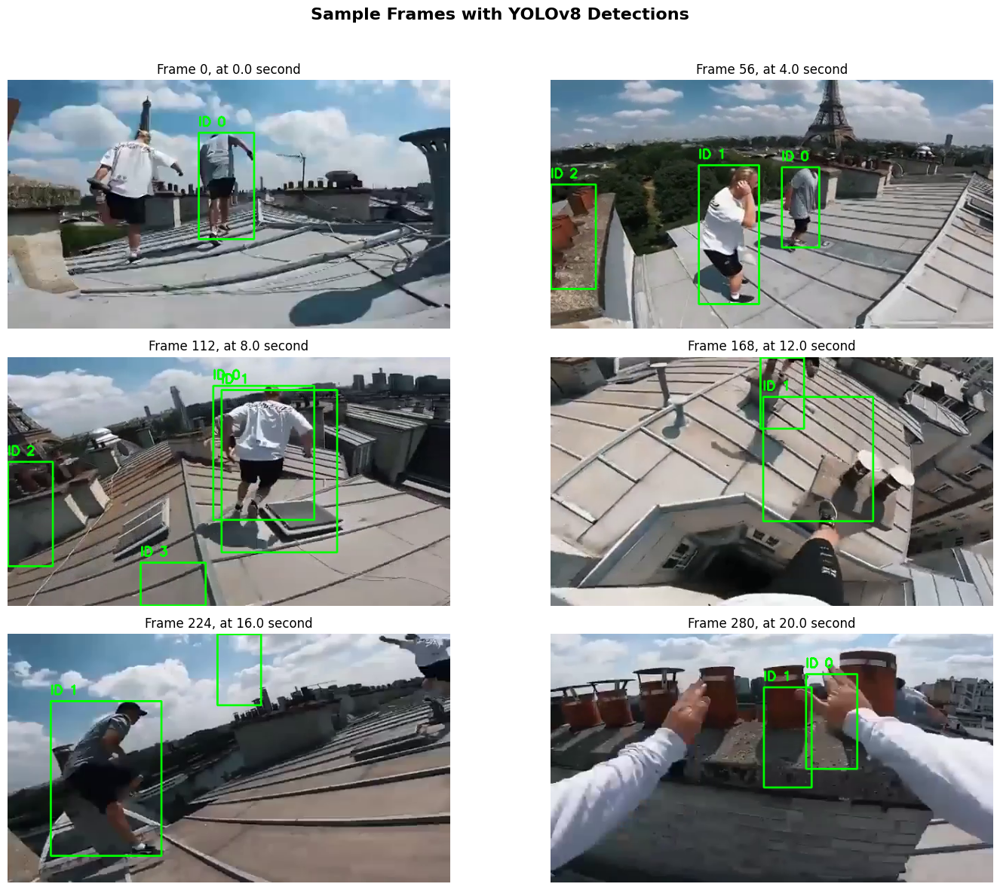

In [47]:
# width=15, height=12 for clarity
plt.ioff()
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 12))
fig.suptitle("Sample Frames with YOLOv8 Detections", fontsize=16, fontweight="bold")

# to loop through 3x2 grid easily
axes_flat = axes.flatten()

for i, (frame, ax) in enumerate(zip(frames_to_plot, axes_flat)):
    ax.imshow(frame)  # Show the frame (RGB format from Step 6)
    original_frame_num = i * sample_interval  # Calculate original frame number
    timestamp = original_frame_num / fps 
    ax.set_title(f"Frame {original_frame_num}, at {timestamp} second", fontsize=12)
    ax.axis("off")  # Hide axis ticks/labels

# if fewer than 6 samples
for idx in empty_plot_indices:
    axes_flat[idx].axis("off")
    axes_flat[idx].set_visible(False)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make space for the main title
plt.show()

In [48]:
with open(output_video, "rb") as f:
    video_bytes = f.read()
video_b64 = base64.b64encode(video_bytes).decode()  # Convert to text format for HTML

video_html = f"""
<video width="800" controls loop style="max-width:100%; border: 2px solid #ddd; border-radius: 8px;">
    <source src="data:video/mp4;base64,{video_b64}" type="video/mp4">
    Your browser does not support HTML5 video playback.
</video>
<p style="color: #666; margin-top: 8px;">
    Video will loop automatically. Use controls to play/pause, adjust volume, or fullscreen.
</p>
"""

display(HTML(video_html))
print("  • Video embedded successfully with looping enabled!")

  • Video embedded successfully with looping enabled!


Loop 2/3: Adding Annotations: 100%|██████████| 282/282 [00:18<00:00, 1198.91it/s, Last sample saved=Frame 280]